# Practical Session 2
## Biomedical Signals and Images
### ETRO: Deparment of Electronics and Informatics
### Vrije Universiteit Brussel

Evgenia Papavasileiou, Mumtaz Hussain Soomro and Jef Vandemeulebroucke


<font color=blue>Students names and IDs: </font><br>Tanjil Hasan - 0586496 <br>Mahsa Alirezaee - 0574173  <Br>
<font color=blue>Academic Year </font>: 2021-2022

### Purpose
The purpose of this exercise session is to obtain insight in the signal processing, filtering and detection operations commonly applied in medical signal analysis. For more information on these concepts see the course slides and the related material.

The jupyter notebook should be submitted as the report of each practical session by teams of <b>two</b> students. In [colab](https://colab.research.google.com/notebooks/welcome.ipynb) you should download the notebook in the format *.ipynb and save it as a pdf version through print->save as pdf. Both the jupyter notebook and the pdf should be uploaded on canvas in a zip file before the deadline.The deadline for the report submission is December 5th 2021, at 23.59. Any report sent after the deadline will not be graded. 

### File upload in google colab:
You can upload the files that are needed for this exercise in google drive and then access them with the following code:

from google.colab import drive <br>
drive.mount('/content/gdrive') <br>

In the following link you can find alternative ways and [examples](https://colab.research.google.com/notebooks/io.ipynb)

### 1. Signal Denoising
ECG signals are usually distorted by a combination of high and low frequency noise as well as artificats of the frequency of the power line. The low frequency noise may be removed by using a highpass filter and the noise of
high frequency may be removed by using a lowpass filter.
### 1.1 Power Line Interference
Alternating current in the United States and several other countries oscillates at a frequency of 60 Hz and in the EU around 50 Hz. Those oscillations often corrupt measurements and have to be subtracted. Filtering of power line interference is very meaningful in the measurement of biomedical events, particularly in the case of recording signals as weak as the ECG. This kind of disturbance can be modeled by a sinusoid with respective frequency and random phase. Generally, methods used to reduce this kind of disturbance can be divided into two groups: methods based in spectral domain and methods based in time domain. Typically, for reduction of the AC interference in a spectral domain, a fixed or adaptive notch filter is used, i.e. a band-stop filter with a narrow stopband, while in time domain a moving average filter is often used.

### Exercise 1: Removal of Power Line Interference

- In python, load the noisy ECG signal ECG_ex1.mat using function [scipy.io.loadmat](https://docs.scipy.org/doc/scipy/reference/generated/scipy.io.loadmat.html).
Use functions [numpy.ndarray.astype](https://numpy.org/doc/stable/reference/generated/numpy.ndarray.astype.html) to convert the values to float and function [numpy.ndarray.flatten](https://numpy.org/doc/stable/reference/generated/numpy.ndarray.flatten.html) to collapse the array in one dimension.
- Plot the signal in time domain with a sampling frequency fs=200Hz.

- Calculate the fourier transform of the signal using the [fft](https://docs.scipy.org/doc/numpy/reference/routines.fft.html) function and plot its magnitude.
<Br>


### importing libraries 

In [1]:
import numpy as np 
import pandas as pd

### Excerise 01 = > 1

In [2]:
import scipy.io
#Your code here:
#loading ECG singnal from the file usuing the mentioned function
noisy_ecg_signal = scipy.io.loadmat("ECG_ex1.mat")
noisy_ecg_signal=noisy_ecg_signal['ecg']
#coverting the values into float 
noisy_ecg_signal=noisy_ecg_signal.astype(float)
#flattening the two dimensional array into one dimensional array
noisy_ecg_signal=noisy_ecg_signal.flatten()

In [3]:
sampling_frequency = 200
#acquiring time domain array
time_domain = [i/sampling_frequency for i in range(len(noisy_ecg_signal))]

### Excerise 01 = > 2 Plotting

In [4]:
#plotting signal with time domain
df = pd.DataFrame()
df['noisy_ecg_signal'] = noisy_ecg_signal
df['time_domain'] = time_domain

import plotly.express as px
fig = px.line(df,x='time_domain', y='noisy_ecg_signal')
fig.show()

### Excerise 01 = > 3

In [5]:
#fourier transform generating function
def create_fourier_transform(signal, fs):
    fourier_transform = np.fft.fft(signal)
    freq = np.fft.fftfreq(len(fourier_transform), d=1/fs) 
    return freq,fourier_transform

In [6]:
#acquiring fourier transform from the signal
frequencies,fourier_transform = create_fourier_transform(noisy_ecg_signal,200)
magnitudes = np.abs(fourier_transform)

#plotting fourier's magnitude with frewqunecies 
df['magnitudes of fourier']=magnitudes
df['frequencies'] = frequencies

import plotly.express as px
fig = px.line(df,x='frequencies', y='magnitudes of fourier')
fig.show()

Where do you see the frequency of the power line?<br>
<font color=blue>Your answer here:</font>

As we have noticed a high reading at 60 Hz , which resembles the frequency of power line , so this signal must have been collected from United States

- Design a notch filter that remove the frequency of the power line that you observed from the above spectrum. Use the following [scipy.signal.iirnotch](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.iirnotch.html) function with a Quality factor=30. Plot the magnitude of the filter. 
- Filter the noisy ECG signal using the python function [filtfilt](https://docs.scipy.org/doc/scipy-0.18.1/reference/generated/scipy.signal.filtfilt.html) and plot the filtered signal in the time domain.
- Calculate the Fourier transform of the ECG signal after filtering and plot its magnitude. <br>
 


## Excerise 01 = > creating a notch filter to remove 50 HZ frequncy from the power line
### We created the 50 Hz filter though its not necessary just to be sure that it doesnt have 50 and 60 hz noise of the power line goal is to have betther result

In [7]:
#Your code here:
import scipy.signal
#creating a notch filter to remove 50 HZ frequncy from the power line 

notch_filter_for_50_hz = scipy.signal.iirnotch(50,30,200)
b, a= notch_filter_for_50_hz

## Plotting the magnitudes of frequncy response of Notch Filter for 50 Hz


In [8]:
frequncies , frequncy_response = scipy.signal.freqz(b,a,fs=200)

magnitudes_of_frequncy_response = np.abs(frequncy_response)

In [9]:
df_notch_50=pd.DataFrame()
df_notch_50['frequency']=frequncies
df_notch_50['magnitudes_of_frequncy_response']=magnitudes_of_frequncy_response

import plotly.express as px
fig = px.line(df_notch_50,x='frequency', y='magnitudes_of_frequncy_response')
fig.show()

##  Excerise 01 = > creating a notch filter to remove 60 HZ frequncy from the power line

In [10]:
notch_filter_for_60_hz = scipy.signal.iirnotch(60,30,200)
b, a= notch_filter_for_60_hz

## Plotting the magnitudes of frequncy response of Notch Filter for 60 Hz

In [11]:
frequncies , frequncy_response = scipy.signal.freqz(b,a,fs=200)

magnitudes_of_frequncy_response = np.abs(frequncy_response)

In [12]:
df_notch_60=pd.DataFrame()
df_notch_60['frequency']=frequncies
df_notch_60['magnitudes_of_frequncy_response']=magnitudes_of_frequncy_response

import plotly.express as px
fig = px.line(df_notch_60,x='frequency', y='magnitudes_of_frequncy_response')
fig.show()

##  Excerise 01 = > FItering noisy ecg using Notch Filter for 50 Hz

In [13]:
b, a= notch_filter_for_50_hz
filterd_from_50 = scipy.signal.filtfilt(b, a, noisy_ecg_signal)

## ploting filtered out 50 HZ ECG signal with time domain  

In [14]:
#plotting signal with time domain
df_50_filter = pd.DataFrame()
df_50_filter['Filterd_out_50 HZ ECG'] = filterd_from_50
df_50_filter['time_domain'] = time_domain

import plotly.express as px
fig = px.line(df_50_filter,x='time_domain', y='Filterd_out_50 HZ ECG')
fig.show()

## Excerise 01 = > FItering noisy ecg using Notch Filter for 60 Hz over the singnal filtered out 50 hz

In [15]:
b, a= notch_filter_for_60_hz
filterd_from_60 = scipy.signal.filtfilt(b, a, filterd_from_50)

## ploting filtered out 60 HZ and 50 Hz ECG signal with time domain 

In [16]:
#plotting signal with time domain
df_60_filter = pd.DataFrame()
df_60_filter['Filterd_out_60 and 50 HZ ECG'] = filterd_from_60
df_60_filter['time_domain'] = time_domain

import plotly.express as px
fig = px.line(df_60_filter,x='time_domain', y='Filterd_out_60 and 50 HZ ECG')
fig.show()

##  Excerise 01 = > calculating fourier of filtered out 50 and 60 hz ECG singnal and ploting magnitude

In [17]:
#acquiring fourier transform from the filtered_signal
frequencies,fourier_transform = create_fourier_transform(filterd_from_60,200)
magnitudes = np.abs(fourier_transform)

#plotting fourier's magnitude with frewqunecies
df_Filtered_ECG = pd.DataFrame()
df_Filtered_ECG['magnitudes of fourier of filted ECG']=magnitudes
df_Filtered_ECG['frequencies'] = frequencies
df_Filtered_ECG['time_domain'] = time_domain

import plotly.express as px
fig = px.line(df_Filtered_ECG,x='frequencies', y='magnitudes of fourier of filted ECG')
fig.show()

What do you observe from the frequency spectrum of the filtered ECG signal?<br>
<font color=blue> Your answer here: </font>

The powerline frequncy is not present (60 Hz) here as we have applied filters 

### 1.2 Digital Filters
Digital filters are systems that function on discrete signals to reduce or enhance specific aspects of the signal. In this exercise we will focus on filters that are used to improve the Signal to Noise ratio (SNR) of a signal, i.e. we will use filters to remove the noise from an ECG signal. A filter is defined by its transfer function in the z-domain or by its difference equation. The general transfer function for a linear, time-invariant, digital filter is defined as in (1)

\begin{equation*}
H(z) =\frac{b[0]+b[1]z^{-1}+b[2]z^{-2}+...+b[K]z^{-K}}{1+a[1]z^{-1}+a[2]z^{-2}+...+a[L]z^{-L}} = 
\frac{ \sum_{k=0}^K b[k]z^{-k}} { \sum_{l=0}^L a[l]z^{-l}} \quad\quad\quad\quad\quad\quad\quad\quad \text{(1)}
\end{equation*}

The corresponding difference equation is then

\begin{equation*}
y(n) = \sum_{k=0}^K b[k]x[n-k] - \sum_{l=0}^L a[l]y[n-l]      \quad\quad\quad\quad\quad\quad\quad\quad\quad\quad\quad\quad\quad\quad\quad\quad\quad\text{(2)}
\end{equation*}

A special case of (1), (2) occurs if we set $a_{l}$ = 0 for l = 1, ..., L. Then we get the system in equation (3) which is known as the weighted moving average of the input signal.

\begin{equation*}
\quad\quad\ y(n) = \sum_{k=0}^K b[k]x[n-k]   \quad\quad\quad\quad\quad\quad\quad\quad\quad\quad\quad\quad\quad\quad\quad\quad\quad\quad\quad\quad\quad\text{(3)}
\end{equation*}

The coefficients b[k] are known as the <b>weights</b>, or filter coefficients, or the weighting function or impulse response and K is known as the <b>length</b> of the filter.

### Exercise 2: ECG signal denoising using moving average fiter
- Load the ECG signal ECG_ex2.mat as in previous exercise. Use functions [numpy.ndarray.astype](https://numpy.org/doc/stable/reference/generated/numpy.ndarray.astype.html) to convert the values to float and function [numpy.ndarray.flatten](https://numpy.org/doc/stable/reference/generated/numpy.ndarray.flatten.html) to collapse the array in one dimension. 
- Plot the signal in the time domain. Use sampling frequency fs = 1024Hz.
- Design a 3-points (K=3) and a 7-points (K=7) moving average filter. Each filter has equal weights that sum up to 1. To define the filter you should define the b and a coefficients of the [filtfilt](https://docs.scipy.org/doc/scipy-0.18.1/reference/generated/scipy.signal.filtfilt.html) function. Use this to filter the noisy signal.
- Plot three subgraphs the one under the other. The first plot should contain the original signal and the others the filtered signal after the application of each moving average filter. Plot the filtered signals <b>on top</b> of the original signal. 



###  Excerise 02 = > 01

In [18]:
import scipy.io

#loading ECG singnal from the file usuing the mentioned function
noisy_ecg_signal_ex2 = scipy.io.loadmat("ECG_ex2.mat")
noisy_ecg_signal_ex2 = noisy_ecg_signal_ex2 ['ecg_hfn']

#converting each elements of array in to float 
noisy_ecg_signal_ex2 = noisy_ecg_signal_ex2.astype(float)

#convering each 2D list to one dimentional list usuing flatten

noisy_ecg_signal_ex2 = noisy_ecg_signal_ex2.flatten()

###  Excerise 02 = > 02

In [19]:
sampling_frequency = 1204
#acquiring time domain array
time_domain_ex2 = [i/sampling_frequency for i in range(len(noisy_ecg_signal_ex2))]

#plotting signal with time domain
df_ex2 = pd.DataFrame()
df_ex2['noisy_ecg_signal_ex2'] = noisy_ecg_signal_ex2
df_ex2['time_domain_ex2'] = time_domain_ex2

import plotly.express as px
fig11 = px.line(df_ex2,x='time_domain_ex2', y='noisy_ecg_signal_ex2')
fig11.show()

### Excerise 02 = > 03

In [20]:
#determining a and b co effiecents for 3 points Moving average filter

k = 3
b = (np.ones(k))/k
a = np.ones(1)

# filtering signals with 3 points moving averag
import scipy.signal
filtered_signals_3points = scipy.signal.filtfilt(b,a,noisy_ecg_signal_ex2)

In [21]:
#determining a and b co effiecents for 7 points Moving average filter

k = 7
b = (np.ones(k))/k
a = np.ones(1)

# filtering signals with 7 points moving averag
import scipy.signal
filtered_signals_7points = scipy.signal.filtfilt(b,a,noisy_ecg_signal_ex2)

In [22]:
df_ex2['filtered_signals_3points'] = filtered_signals_3points
df_ex2['filtered_signals_7points'] = filtered_signals_7points
import plotly.express as px

#first Plotting orginal;
fig___1 = px.line(df_ex2,x='time_domain_ex2', y='noisy_ecg_signal_ex2')
fig___1.show()

In [23]:
# Plotting filterd signal;
fig__2 = px.line(df_ex2,x='time_domain_ex2', y='filtered_signals_3points')
fig__2.show()

In [24]:
fig_3 = px.line(df_ex2,x='time_domain_ex2', y='filtered_signals_7points')
fig_3.show()

In [25]:
import plotly.graph_objs as go


fig = go.Figure([
    
    go.Scatter(
        name='Filtered Signals with 7 points MAvF',
        x=df_ex2['time_domain_ex2'],
        y=df_ex2['filtered_signals_7points'],
        mode='lines',
        marker=dict(color='red', size=2),
        showlegend=True
    ),
    go.Scatter(
        name='Filtered Signals with 3 points MAvF',
        x=df_ex2['time_domain_ex2'],
        y=df_ex2['filtered_signals_3points'],
        mode='lines',
        marker=dict(color="blue"),
        line=dict(width=1),
        opacity=0.7,
        showlegend=True
    ),
    go.Scatter(
        name='noisy_ecg_signal_ex2',
        x=df_ex2['time_domain_ex2'],
        y=df_ex2['noisy_ecg_signal_ex2'],
        marker=dict(color="green "),
        line=dict(width=1),
        mode='lines',
        opacity=0.4,
        showlegend=True
    )
])
fig.update_layout(
    yaxis_title='singnals',
    xaxis_title = 'time',
    title='ploting singnals against time domain',
    hovermode="x"
)
fig.show()



Which filter removes the noise better and why? <br>
<font color=blue>Your answer here: </font>

From visiualization it can be distinguised and percepted that filter with 7 points removed noises better as they are have seen more stable signal from plotting and this has become possible for increament of number of points referring to k values.

### 3. Peak detection
### Exercise 3: Peak Detection from ECG signals
In this exercise you will create an algorithm for the detection of the QRS wave of an ECG signal by implementing the following steps:<br>

<b>Part One: Apply a series of filters</b><br>
- Step 1: Load the ECG signal ECG_ex3.mat as in the previous exercises and plot it in the time domain using sampling frequency fs = 200Hz.
- Step 2: Normalize the ECG signal by dividing with the maximum absolute value. Plot the normalized signal.
Or they do it by (y-min)/(max-min)
- Step 3: Filter the signal you obtain from the previous step with a bandpass filter by cascading a low pass digital filter with cutoff frequency of 12 Hz and a high pass digital filter with cutoff frequency of 5Hz. Use function [scipy.signal.butter](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.butter.html) to create the filters whose order be 3 and function [scipy.signal.lfilter](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.lfilter.html) to filter the signal. Plot the filtered signals after each step.
- Step 4: Filter the signal of the previous step with a derivative filter that has the transfer function h = [-1, -2, 0, 2, 1]/8. From this you can get the b and a coefficients, i.e. b[0]=-1/8, b[1]=-2/8 etc. Again use [scipy.signal.lfilter](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.lfilter.html) to filter the signal. Plot the filtered signal
- Step 5: Perform Squaring on the ECG signal you obtain after the derivative filter. Plot the filtered signal.
- Step 6: Filter the squared signal with a 30 point moving average filter. Plot the filtered signal. <br>

<b>Part Two: Use a built in python function on the original signal</b> <br>
- Use [find_peaks](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.find_peaks.html) function on the normalized ECG signal from <b>step2</b>, for finding the QRS complexes. Use distance 150 for the R and S peaks and prominence between 0.05 and 0.3 for the Q peaks. Plot the QRS complexes on top of the original signal. Keep a critical eye on the result. In this [link](https://www.google.com/search?q=qrs+complex&rlz=1C1PRFI_enBE772BE772&source=lnms&tbm=isch&sa=X&ved=2ahUKEwiZ5_i24p_tAhXJzqQKHSW2BIMQ_AUoAXoECBEQAw&biw=1920&bih=937#imgrc=e1DK720GR0Ca-M) you can find an image that shows the Q,R,S peaks of an ECG signal. It is a good idea to use different symbols for depicting the Q,R,S peaks on top of the ECG signal.

- Calculate the heart beat using the following formula. Heart Rate = 60/RRinterval in seconds.



### Step 01

In [26]:
#Your code here:
import scipy.io

#loading ECG singnal from the file usuing the mentioned function
noisy_ecg_signal_ex3 = scipy.io.loadmat("ECG_ex3.mat")
noisy_ecg_signal_ex3 = noisy_ecg_signal_ex3 ['ECG']
#converting each elements of array in to float 
noisy_ecg_signal_ex3 = noisy_ecg_signal_ex3.astype(float)

#convering each 2D list to one dimentional list usuing flatten
noisy_ecg_signal_ex3 = noisy_ecg_signal_ex3.flatten()

In [27]:
sampling_frequency = 200
#acquiring time domain array
time_domain_ex3 = [i/sampling_frequency for i in range(len(noisy_ecg_signal_ex3))]

#plotting signal with time domain
df_ex3 = pd.DataFrame()
df_ex3['noisy_ecg_signal_ex3'] = noisy_ecg_signal_ex3
df_ex3['time_domain_ex3'] = time_domain_ex3

import plotly.express as px
fig__1 = px.line(df_ex3,x='time_domain_ex3', y='noisy_ecg_signal_ex3')
fig__1.show()

### step 2 

In [28]:
#normalizing the signals by devdiding the descrestes by maximum absolute value of the signal
normalized_signals=np.true_divide(noisy_ecg_signal_ex3,max(np.abs(noisy_ecg_signal_ex3)))

In [29]:
#plotting the normalized signal by time domain
df_ex3['normalized_signals'] = normalized_signals
df_ex3['time_domain_ex3'] = time_domain_ex3

import plotly.express as px
fig = px.line(df_ex3,x='time_domain_ex3', y='normalized_signals')
fig.show()



### step 3

In [30]:
#low pass filter generation with order 3 
order = 3
cut_off = 12
critical_frequency = cut_off / (0.5 * 200)

import scipy.signal

low_pass_filter = scipy.signal.butter(order, critical_frequency, btype ='lowpass')
b , a = low_pass_filter

filtered_with_low_pass_signal = scipy.signal.lfilter(b,a,normalized_signals)

In [31]:
#plotting the filtered_with_low_pass_signal by time domain

df_ex3['filtered_with_low_pass_signal'] = filtered_with_low_pass_signal

import plotly.express as px
fig = px.line(df_ex3,x='time_domain_ex3', y='filtered_with_low_pass_signal')
fig.show()

In [32]:
#high pass filter generation with order 3 
order = 3
cut_off = 5
critical_frequency = cut_off / (0.5 * 200)

import scipy.signal

high_pass_filter = scipy.signal.butter(order, critical_frequency, btype ='highpass')
b , a = high_pass_filter

#obtaining final signal after using low pass and high pass sequnetially 
filtered_with_low_and_high = scipy.signal.lfilter(b,a,filtered_with_low_pass_signal)

In [33]:
#plotting the filtered_with_high_pass_signal by time domain

df_ex3['filtered_with_low_and_high'] = filtered_with_low_and_high

import plotly.express as px
fig__ = px.line(df_ex3,x='time_domain_ex3', y='filtered_with_low_and_high')
fig__.show()

### step 4

In [34]:

h = np.asarray([-1, -2, 0, 2, 1])

b = np.true_divide(h,8)
a = np.ones(1)

filtered_singnal_step4 = scipy.signal.lfilter(b,a,filtered_with_low_and_high)

In [35]:
#plotting the filtered_singnal_step4 by time domain

df_ex3['filtered_singnal_step4'] = filtered_singnal_step4

import plotly.express as px
fig_ = px.line(df_ex3,x='time_domain_ex3', y='filtered_singnal_step4')
fig_.show()

### step 5

In [36]:
filtered_with_squaring = np.square(filtered_singnal_step4)

In [37]:
#plotting the filtered_with_squaring by time domain

df_ex3['filtered_with_squaring'] = filtered_with_squaring

import plotly.express as px
fig = px.line(df_ex3,x='time_domain_ex3', y='filtered_with_squaring')
fig.show()

### step 6

In [38]:
#determining a and b co effiecents for 3 points Moving average filter

k = 30
b = (np.ones(k))/k
a = np.ones(1)

# filtering signals with 30 points moving averag
import scipy.signal
filterd_with_30_MAvg = scipy.signal.filtfilt(b,a,filtered_with_squaring)

In [39]:
#plotting the filtered_with_squaring by time domain

df_ex3['filterd_with_30_MAvg'] = filterd_with_30_MAvg

import plotly.express as px
fig = px.line(df_ex3,x='time_domain_ex3', y='filterd_with_30_MAvg')
fig.show()

## Part Two

In [40]:
R_peaks = scipy.signal.find_peaks(normalized_signals,distance=150)
S_peaks = scipy.signal.find_peaks(-normalized_signals,distance=150)
Q_peaks = scipy.signal.find_peaks(-normalized_signals,prominence=[0.05,0.3])

## As we are aplogising because of using matplot lib here , as you have seen that we were usuing plotly , we tried to plot the peaks with plotly there we faced some error , we attached the image here 
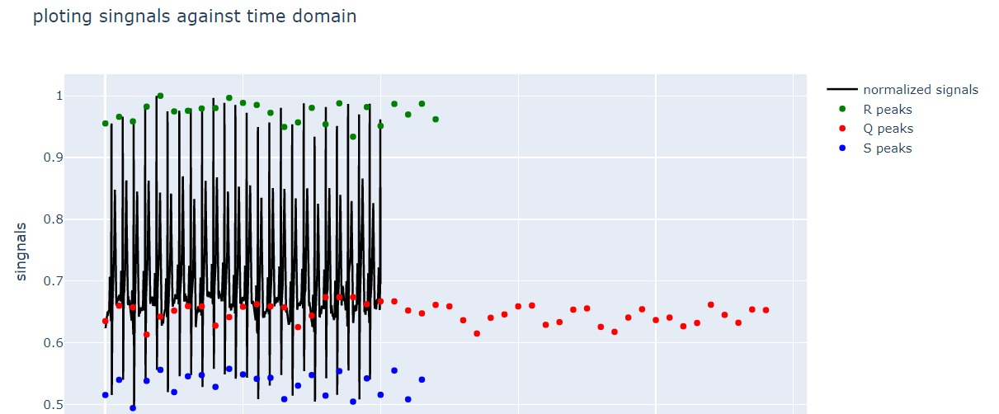 

so for this reason we have used matplotlib to nail the objectives , but we can come with solution in plotly

# so we expect that you will reconsider this. Here is the correct solution of QRS detection. 

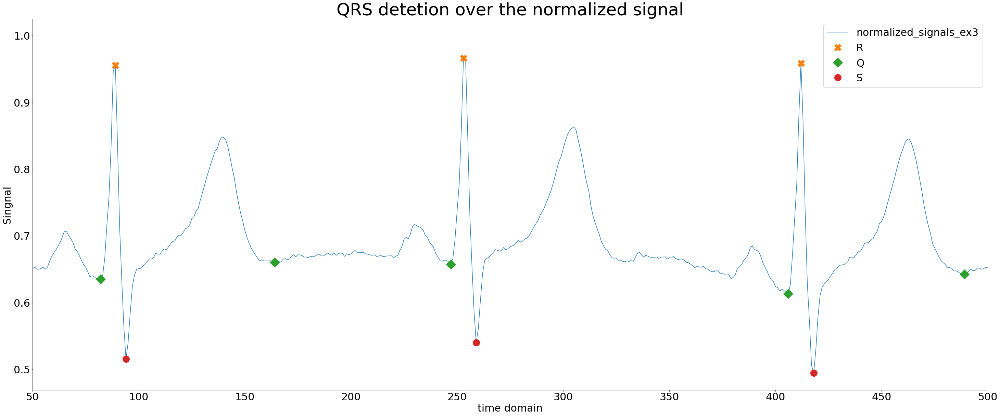

In [41]:
import matplotlib.pyplot as plt


plt.figure(figsize=(50, 20))
plt.xlim(50,500)
plt.title(label='QRS detetion over the normalized signal',fontsize=50)
plt.plot(normalized_signals)
plt.xlabel('time domain',fontsize = 30)
plt.ylabel('Singnal', fontsize = 30)
plt.xticks(fontsize=30,)
plt.yticks(fontsize=30,)
plt.plot(R_peaks[0], normalized_signals[R_peaks[0]], "X", markersize=20)
plt.plot(Q_peaks[0], normalized_signals[Q_peaks[0]], "D", markersize=20)
plt.plot(S_peaks[0], normalized_signals[S_peaks[0]], "o", markersize=20)
plt.legend(["normalized_signals_ex3", "R", "Q", "S"], prop= {"size":30})
plt.show()

### Heart rate Avergae

In [42]:
def get_time_from_frequency(f,fs = 200):
  time = f / fs
  return time

heart_rate_list = [ 60 / (get_time_from_frequency(R_peaks[0][i+1]) - get_time_from_frequency(R_peaks[0][i])) for i in range(0 , len(R_peaks[0])-1)]

In [43]:
print(f" The average Heart rate is {sum(heart_rate_list)/len(heart_rate_list)}")

 The average Heart rate is 73.76056169410425


What is the Heart Rate?<br>
<font color=blue>Your answer here: </font>
The average Heart rate is 73.76056169410425